In [1]:
pacman::p_load(ggplot2,ggpubr,phylotools,geiger,ggtreeExtra,data.table,
               phytools,phyloseq,ggtree,ape,grid,tidyr,wesanderson,
               ggnewscale,stringr,lubridate,ggridges,patchwork,ggstance,dendextend,tidyverse,
               cowplot,patchwork,psych,
               beeswarm,ggbeeswarm,data.table,ggridges,rjson,ggupset,plotly,reticulate,
               plot3D,RColorBrewer,mapproj,mapdata,ggrepel,
               ggpubr,phylotools,geiger,ggtreeExtra,data.table,
               phytools,phyloseq,ggtree,ape,grid,tidyr,wesanderson,aplot,
               ggnewscale,stringr,lubridate,ggridges,patchwork,ggstance,dendextend,tidyverse,ggupset)

In [3]:
## From Python code/notebook

abund_frame = read.csv("../jupyter-notebooks/short_code_abund_mean_cov.csv")

In [ ]:
abund_frame = abund_frame %>% dplyr::filter((Depth=="SRF")&(SizeFract %in% c("Small","Largest")))

In [ ]:
world_map <- map_data("world")
med_map <- world_map %>% dplyr::filter((lat > 30) & (lat < 45) & (long > -5) & (long < 20))
so_map <- world_map %>% dplyr::filter((lat < -45) & (lat > min(world_map$lat)) & (long < -55) & (long > -75))

## LATITUDE AND LONGITUDE OF THE MAJOR OCEANS ##
# source: https://www.marineregions.org/gazetteer.php?p=details&id=8562
ocean_coords = data.frame("Oceans"=c("SPO","NPO","NAO","SAO","IO","SO","MS","RS"),
           "Latitude"=c(-30.098,26.95235,31.7771,-33.73345,-27.26765,-68.03982,38.02360535,20.56524),
           "Longitude"=c(-143.06093,-169.38414,-40.24965,-18.83777,79.60243,-26.63286,15.09230423,38.57739))

overall_map <- ggplot(abund_frame %>% dplyr::left_join(ocean_coords,
                                                       by = c("ShortCode"="Oceans")) %>%
                      dplyr::mutate(Latitude=case_when(SizeFract=="Largest" ~ Latitude+10,
                                                       TRUE ~ Latitude),
                                    Longitude=case_when(PhaeoDB=="phaeo_all"~Longitude+20,
                                                        PhaeoDB=="colonies_phaeo"~Longitude-20,
                                                        TRUE~Longitude)))+
    geom_polygon(data = world_map, aes(x=long,y=lat,group=group),fill="white", colour = "gray") + 
    coord_map(xlim=c(-180,180))+
    geom_rect(aes(xmin=-5,xmax=50,ymin=15,ymax=50),fill="transparent",color="black",linetype="dotdash")+
    geom_point(aes(y = Latitude, x = Longitude, fill = PhaeoDB, size = TotalAll, shape = SizeFract,
                   group = paste0(PhaeoDB,SizeFract)),alpha=0.75)+
    scale_shape_manual(values=c(21,22),name="Size fraction") +
    scale_fill_manual(values=c("white","black","gray"),breaks=c("phaeo_all","colonies_phaeo",
                                                            "free_phaeo"),
                      name="Database") +
    scale_fill_manual(values=c("black","#c2bdf5","#fabfb7"),breaks=c("phaeo_all","colonies_phaeo",
                                                            "free_phaeo"),
                      labels = c("Full database", "Colony formers", "Free-living"),
                      name="Database")+
    scale_size(range=c(0.25,15),name="Total coverage of\nproteins from metagenome") + 
    guides(fill=guide_legend(override.aes = c(size=6,pch=21)),
           shape=guide_legend(override.aes = c(size=6))) + 
    theme_void(base_size=12)
overall_map
ggsave("worldmap_cds.pdf",width=10,height=6,units="in")

## Create _Phaeocystis_ tree

In [5]:
tree_file_loc <- "/vortexfs1/omics/alexander/akrinos/2022-euk-diversity/code/jupyter-notebooks/extracted-phaeo/2022-11-25_2/trees/fasttree.nwk"
tree_file_loc="/vortexfs1/omics/alexander/akrinos/2022-euk-diversity/output/ehux-aik-orthofinder-output/extracted_seqs_single_copy_phaeo_ehux_dedup/trees/raxml/RAxML_bestTree.EUK-MAG"
tree_file <- as.phylo(ggtree(read.tree(tree_file_loc),layout="circular"))
    
    #"phaeo_with_txme_fasttree.nwk"),layout="circular"))
tree_plot <- as.data.frame(tree_file %>% fortify() %>%
                               as_tibble()) 
input_tree_dict = read.csv("../jupyter-notebooks/tax-table.txt") %>% 
        dplyr::bind_rows(read.csv("../jupyter-notebooks/mmetsp-tax.txt")) %>%
        dplyr::bind_rows(read.csv("../jupyter-notebooks/phaeo-taxonomy-table.txt",sep="\t") %>%
                         dplyr::mutate(Labels=paste0("busco-",Source_ID,"-phaeo"))) %>%
    dplyr::mutate(Labels=case_when(grepl("MMETSP",Labels) ~ paste0("busco-",Labels,"-mmetsp"),
                                         TRUE ~ Labels))

tree_plot <- tree_plot %>% dplyr::left_join(input_tree_dict,by=c("label"="Labels"))

In [6]:
tree_file <- as.phylo(ggtree(root(read.tree(tree_file_loc),
                                  outgroup="Oxytri1-genome"),
                                       layout="circular"))
tree_plot <- as.data.frame(tree_file %>% fortify() %>%
                               as_tibble()) 
input_tree_dict = read.csv("../jupyter-notebooks/tax-table.txt") %>% 
        dplyr::bind_rows(read.csv("../jupyter-notebooks/mmetsp-tax.txt")) %>%
        dplyr::bind_rows(data.frame("Labels"=c("Phaant1","Phaglo1","Oxytri1",
                                               "Chrsp","Guith1","busco_rmdup_PhaeoCCB-phaeo"),
                                    "Domain"=c("Eukaryota","Eukaryota","Eukaryota",
                                              "Eukaryota","Eukaryota","Eukaryota"),
                                    "Phylum"=c("Haptophyta","Haptophyta","Ciliophora",
                                              "Haptophyta","Cryptophyta","Haptophyta"),
                                    "Class"=c("Prymnesiophyceae","Prymnesiophyceae","Spirotrichea",
                                              "Eukaryota","Cryptophyceae","Prymnesiophyceae"),
                                    "Order"=c("Phaeocystales","Phaeocystales","Sporadotrichida",
                                              "Prymnesiales","Pyrenomonadales","Phaeocystales"),
                                    "Family"=c("Phaeocystaceae","Phaeocystaceae","Oxytrichidae",
                                              "Chrysochromulinaceae","Geminigeraceae","Phaeocystaceae"),
                                    "Genus"=c("Phaeocystis","Phaeocystis","Oxytricha",
                                              "Chrysochromulina","Guillardia","Phaeocystis"),
                                    "Species"=c("Phaeocystis antarctica",
                                                "Phaeocystis globosa",
                                                "Oxytricha trifallax",
                                              "Chrysochromulina tobinii","Guillardia theta",
                                                "Phaeocystis pouchetii"))) %>%
        dplyr::bind_rows(read.csv("../jupyter-notebooks/phaeo-taxonomy-table.txt",sep="\t") %>%
                         dplyr::mutate(Labels=paste0(Source_ID,"-phaeo")))%>%
    dplyr::mutate(Labels=case_when(grepl("MMETSP",Labels) ~ paste0(Labels,"-mmetsp"),
                                         TRUE ~ Labels))

tree_plot <- tree_plot %>% tidyr::separate(label,sep="-genome",into=c("label","extra")) %>%
    dplyr::left_join(input_tree_dict,by=c("label"="Labels"))


unique_phyla = unique(input_tree_dict$Phylum)
unique_phyla = unique_phyla[unique_phyla != ""]

tip_colors <- lapply(unique_phyla, function(x)
{tree_plot$label[grepl(paste(x, collapse="|"),
                         tree_plot$Phylum)]})
names(tip_colors) <- unique_phyla
tip_colors <- Filter(function(x) length(x) > 0, tip_colors)
for_input = as.phylo(ggtree(tree_plot))
tree_to_plot <- for_input

Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 26 rows [1, 2, 3, 4, 5, 7, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, ...].”


Scale for fill is already
present.
Adding another scale for
fill, which will replace
the existing scale.


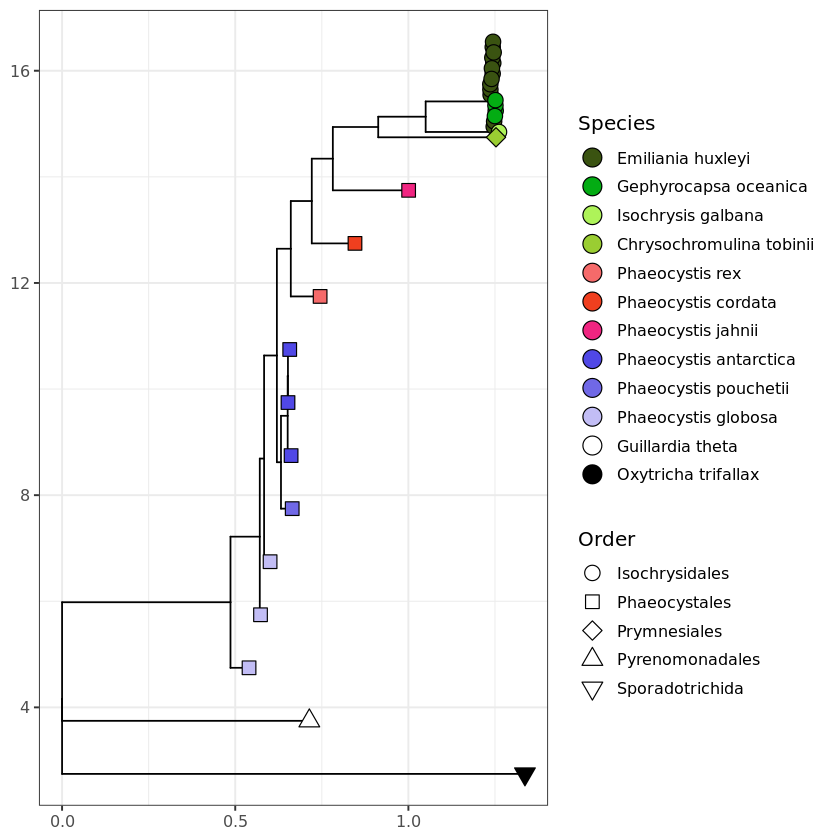

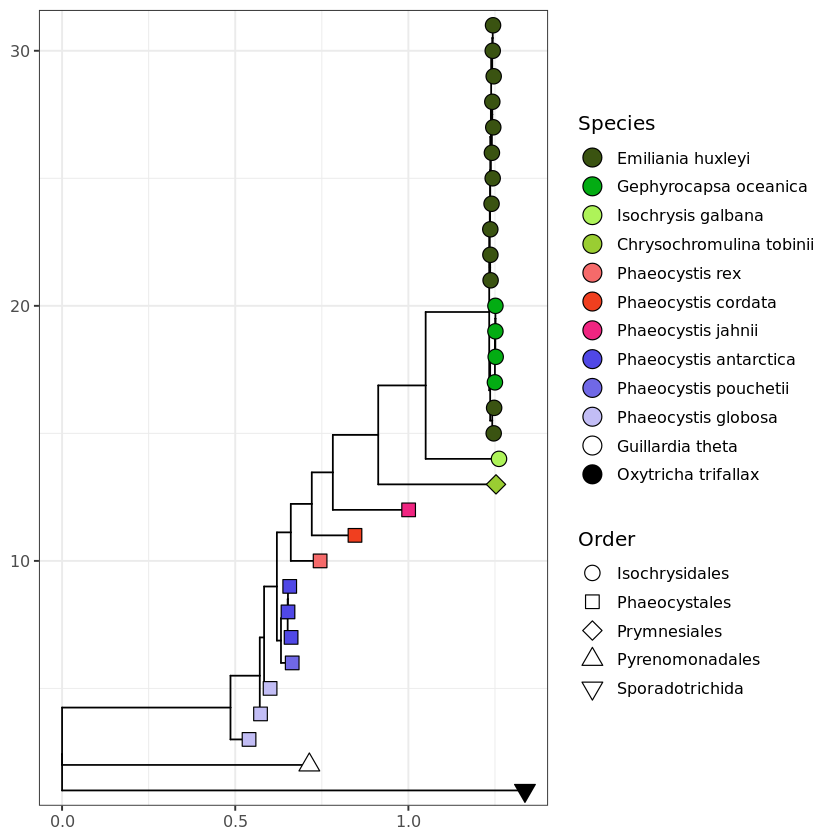

In [7]:
input_tree_dict = read.csv("../jupyter-notebooks/tax-table.txt") %>% 
        dplyr::bind_rows(read.csv("../jupyter-notebooks/mmetsp-tax.txt")%>%dplyr::mutate(Species=paste(Genus,Species,sep=" "))) %>%
        dplyr::bind_rows(data.frame("Labels"=c("Phaant1-genome","Phaglo1-genome","Oxytri1-genome",
                                               "Chrsp-genome","Guith1-genome","busco_rmdup_PhaeoCCB-phaeo"),
                                    "Domain"=c("Eukaryota","Eukaryota","Eukaryota",
                                              "Eukaryota","Eukaryota","Eukaryota"),
                                    "Phylum"=c("Haptophyta","Haptophyta","Ciliophora",
                                              "Haptophyta","Cryptophyta","Haptophyta"),
                                    "Class"=c("Prymnesiophyceae","Prymnesiophyceae","Spirotrichea",
                                              "Eukaryota","Cryptophyceae","Prymnesiophyceae"),
                                    "Order"=c("Phaeocystales","Phaeocystales","Sporadotrichida",
                                              "Prymnesiales","Pyrenomonadales","Phaeocystales"),
                                    "Family"=c("Phaeocystaceae","Phaeocystaceae","Oxytrichidae",
                                              "Chrysochromulinaceae","Geminigeraceae","Phaeocystaceae"),
                                    "Genus"=c("Phaeocystis","Phaeocystis","Oxytricha",
                                              "Chrysochromulina","Guillardia","Phaeocystis"),
                                    "Species"=c("Phaeocystis antarctica",
                                                "Phaeocystis globosa",
                                                "Oxytricha trifallax",
                                              "Chrysochromulina tobinii","Guillardia theta",
                                                "Phaeocystis pouchetii"))) %>%
        dplyr::bind_rows(read.csv("../jupyter-notebooks/phaeo-taxonomy-table.txt",sep="\t") %>%
                         dplyr::mutate(Labels=paste0(Source_ID,"-phaeo")) %>%
                         dplyr::mutate(Species=case_when(Labels=="P_sp_ccmp2710-phaeo"~"Phaeocystis globosa",
                                                         Labels=="P_pouchetii_CCB-phaeo"~"Phaeocystis pouchetii",
                                                         TRUE ~ Species)))%>%
    dplyr::mutate(Labels=case_when(grepl("MMETSP",Labels) ~ paste0(Labels,"-mmetsp"),
                                         TRUE ~ Labels))


get_order <- function(input,tax_label="Order") {
    filtered_labels = c()
    for (curr in input) {
        filtered_label = input_tree_dict %>% dplyr::filter(Labels==curr)
        filtered_labels = c(filtered_labels,as.character(filtered_label[tax_label][1]))
    }
    return(filtered_labels)
}
p<-ggtree(as.phylo(ggtree(root(read.tree(tree_file_loc),
                               outgroup="Oxytri1-genome"),
                               layout="circular")),
       layout="rectangular") +
    geom_tippoint(aes(shape=get_order(label),fill=get_order(label,tax_label="Species")),size=4) +
    scale_shape_manual(values=c(21,22,23,24,25),name="Order") + 
    scale_fill_discrete(name="Species") + 
    theme_bw(base_size=12) +
    scale_fill_manual(values=c("#3a5311",
                               "#03AC13","#AEF359",
                               "#9ACD32","#F56A6A","#F03F1F","#F02581","#5048E6",
                               "#7068E6",
                               "#C2BDF5",
                               "white","black","gray"),
                      breaks=c("Emiliania huxleyi",
                               "Gephyrocapsa oceanica",
                               "Isochrysis galbana",
                               "Chrysochromulina tobinii",
                               "Phaeocystis rex",
                               "Phaeocystis cordata",
                               "Phaeocystis jahnii",
                               "Phaeocystis antarctica","Phaeocystis pouchetii",
                               "Phaeocystis globosa",
                               "Guillardia theta","Oxytricha trifallax"),
                      labels=c("Emiliania huxleyi",
                               "Gephyrocapsa oceanica",
                               "Isochrysis galbana",
                               "Chrysochromulina tobinii",
                               "Phaeocystis rex",
                               "Phaeocystis cordata",
                               "Phaeocystis jahnii",
                               "Phaeocystis antarctica","Phaeocystis pouchetii",
                               "Phaeocystis globosa",
                               "Guillardia theta","Oxytricha trifallax"),name="Species") + 
    scale_color_manual(values=c("#952267",
"#daaa00",
"#7b50d7",
"#e27800",
"#a7a9ff",
"#feb875",
"#00a4ae",
"#ff7587",
"#7f4227"),
    breaks=unique((tree_plot %>% dplyr::filter(!is.na(Order)) %>% dplyr::arrange(desc(y)))$Order),
    labels=unique((tree_plot %>% dplyr::filter(!is.na(Order))%>% dplyr::arrange(desc(y)))$Order)) +
    guides(fill = guide_legend(override.aes = list(shape = 21,size=5) ) )

scaled_tree <- scaleClade(p, node=33, 
                          scale=.1) 
scaled_tree
p

## Database abundances for the Southern Ocean

In [8]:
filter_phaeo_data = data.frame(fread("../jupyter-notebooks/combined_frame_filt.csv")) # from Python notebook 00-filter-phaeo

abund_vals = ggplot(as.phylo(ggtree(root(read.tree("/vortexfs1/omics/alexander/akrinos/2022-euk-diversity/code/jupyter-notebooks/extracted-phaeo/2022-11-25_2/trees/fasttree.nwk"),
                               outgroup="Oxytri1"),
                               layout="circular")) %>% as_tibble() %>% 
    dplyr::left_join(ggplot_build(scaleClade(p, node=54, scale=.1))$data[[1]]) %>%
    dplyr::left_join(input_tree_dict%>%
                     dplyr::mutate(Labels=case_when(Source_ID=="P_pouchetii_CCB" ~ "busco_rmdup_PhaeoCCB-phaeo",
                                                                      TRUE ~ Labels),
                                   Source_ID=case_when(Labels=="Phaglo1" ~ "P_globosa_jgi",
                                                       Labels=="Phaant1" ~ "P_ant_jgi",
                                                       TRUE ~ Source_ID)) %>%
                                                     dplyr::left_join(filter_phaeo_data%>% 
                                                                      dplyr::filter((Genus=="Phaeocystis") &
                                                                                    (grepl("SO",TaraSample)))%>%
                                                        dplyr::select(TaraSample,PhaeoDB,
                                                                     TotalBySamp,Fraction,
                                                                     Basin,SizeFract,
                                                                     PercDiff),
                                                        by=c("Source_ID"="PhaeoDB")),
                     by=c("label"="Labels"))  %>% dplyr::filter(!is.na(Basin)) %>%
    dplyr::distinct() %>%
    dplyr::filter(grepl("SRF",TaraSample)|grepl("DCM",TaraSample)|grepl("MIX",TaraSample)) %>%
    dplyr::group_by(y, SizeFract) %>%
    dplyr::summarize(meanFract=mean(Fraction),sdFract=sd(Fraction))) + 
    theme_bw(base_size=14) + 
    geom_bar(aes(x = y, y = meanFract, fill = SizeFract, group = paste0(y, SizeFract)),
            stat="identity",position=position_dodge(width = 0.5),width=0.5)+
    geom_errorbar(aes(x = y, ymax = meanFract+sdFract, ymin = meanFract-sdFract, 
                      group = paste0(y, SizeFract)),
                  position=position_dodge(width=0.5),width=0.3)+ xlim(c(2,20)) + coord_flip()+ 
    scale_shape_manual(values=c(21,22)) + 
    theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "black"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())+xlim(c(2,20))+xlab("Fraction Phaeo\nsequences recovered") + 
    scale_fill_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction")+ 
    scale_color_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction") +
    geom_hline(aes(yintercept=0))

total_db_plot = ggplot(filter_phaeo_data %>% dplyr::filter((PhaeoDB %in% c("phaeo_all","colonies_phaeo",
                                                   "free_phaeo")) & (Genus=="Phaeocystis") & (Basin=="SO")) %>%
          dplyr::mutate(PhaeoDBCoord = case_when(PhaeoDB == "free_phaeo" ~ 12,
                                                 PhaeoDB == "colonies_phaeo" ~ 7.5,
                                                 PhaeoDB == "phaeo_all" ~ 3)) %>%
           dplyr::group_by(PhaeoDBCoord,SizeFract,PhaeoDB) %>%
          dplyr::summarize(meanFract = mean(Fraction),sdFract = sd(Fraction))) + 
    geom_bar(aes(x = PhaeoDBCoord, y = meanFract, fill = SizeFract, group = paste0(PhaeoDB, SizeFract)),
            stat="identity",position=position_dodge(width = 1),width=1)+
    geom_errorbar(aes(x = PhaeoDBCoord, ymax = meanFract+sdFract, ymin = meanFract-sdFract, 
                      group = paste0(PhaeoDB, SizeFract)),
                  position=position_dodge(width=1),width=0.3)+ xlim(c(2,20)) + coord_flip()+
    theme_bw(base_size=14) + 
    theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "black"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())+
    xlab("Fraction Phaeo\nsequences recovered") + 
    scale_fill_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction")+ 
    scale_color_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction")+
    geom_hline(aes(yintercept=0.5),linetype="dotdash")+
    geom_hline(aes(yintercept=0),linetype="solid")

Joining, by = c("parent",
"node")
`summarise()` has grouped
output by 'y'. You can
override using the
`.groups` argument.
Scale for x is already
present.
Adding another scale for
x, which will replace the
existing scale.
`summarise()` has grouped
output by 'PhaeoDBCoord',
'SizeFract'. You can
override using the
`.groups` argument.


In [14]:
filter_phaeo_data

V1,Domain,Phylum,Order,Family,Genus,PhaeoDB,TaraSample,transcript_name,TotalBySamp,Fraction,Basin,SizeFract,PercDiff
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<chr>,<dbl>
0,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,phaeo_all,SAO-all-SRF-0.8-5.00,163112,174694,0.93370121,SAO,Small,-0.06629879
1,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,colonies_phaeo,SAO-all-SRF-0.8-5.00,107086,174694,0.61299186,SAO,Small,-0.38700814
2,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,P_ant_jgi,SAO-all-SRF-0.8-5.00,71113,174694,0.40707179,SAO,Small,-0.59292821
3,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,P_pouchetii_CCB,SAO-all-SRF-0.8-5.00,69385,174694,0.39718021,SAO,Small,-0.60281979
4,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,P_globosa_jgi,SAO-all-SRF-0.8-5.00,65259,174694,0.37356177,SAO,Small,-0.62643823
5,Eukaryota,Haptophyta,Unclassified,Unclassified,Unclassified,P_rex_ccmp2000,SAO-all-SRF-0.8-5.00,53518,174694,0.30635282,SAO,Small,-0.69364718
6,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,free_phaeo,SAO-all-SRF-0.8-5.00,50021,174694,0.28633496,SAO,Small,-0.71366504
7,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,P_antarctica_caron,SAO-all-SRF-0.8-5.00,49422,174694,0.28290611,SAO,Small,-0.71709389
8,Eukaryota,Haptophyta,Phaeocystales,Phaeocystaceae,Phaeocystis,P_cordata_ccmp3104,SAO-all-SRF-0.8-5.00,42040,174694,0.24064936,SAO,Small,-0.75935064


In [20]:
filter_phaeo_data %>% dplyr::group_by(TaraSample,Genus,Fraction,PhaeoDB,TotalBySamp,Basin) %>% dplyr::summarize(sum(transcript_name)) %>%
    dplyr::filter((Genus=="Phaeocystis")&(PhaeoDB %in% c("phaeo_all","colonies_phaeo","free_phaeo"))&(Basin %in% c("MS","SO","RS")))

`summarise()` has grouped
output by 'TaraSample',
'Genus', 'Fraction',
'PhaeoDB', 'TotalBySamp'.
You can override using
the `.groups` argument.


TaraSample,Genus,Fraction,PhaeoDB,TotalBySamp,Basin,sum(transcript_name)
<chr>,<chr>,<dbl>,<chr>,<int>,<chr>,<int>
MS-all-DCM-0.8-5.00,Phaeocystis,0.38124351,colonies_phaeo,58721,MS,22387
MS-all-DCM-0.8-5.00,Phaeocystis,0.59964919,free_phaeo,58721,MS,35212
MS-all-DCM-0.8-5.00,Phaeocystis,0.95040956,phaeo_all,58721,MS,55809
MS-all-DCM-180-2000.00,Phaeocystis,0.46632124,colonies_phaeo,193,MS,90
MS-all-DCM-180-2000.00,Phaeocystis,0.51813472,free_phaeo,193,MS,100
MS-all-DCM-180-2000.00,Phaeocystis,1.00000000,phaeo_all,193,MS,193
MS-all-SRF-0.8-5.00,Phaeocystis,0.39929490,colonies_phaeo,89633,MS,35790
MS-all-SRF-0.8-5.00,Phaeocystis,0.58362433,free_phaeo,89633,MS,52312
MS-all-SRF-0.8-5.00,Phaeocystis,0.93893990,phaeo_all,89633,MS,84160


In [16]:
filter_phaeo_data %>% dplyr::group_by(TaraSample,PhaeoDB) %>% dplyr::summarize(sum(transcript_name))

`summarise()` has grouped
output by 'TaraSample'.
You can override using
the `.groups` argument.


TaraSample,PhaeoDB,sum(transcript_name)
<chr>,<chr>,<int>
IO-all-DCM-0.8-5.00,colonies_phaeo,55865
IO-all-DCM-0.8-5.00,free_phaeo,53234
IO-all-DCM-0.8-5.00,P_ant_jgi,46583
IO-all-DCM-0.8-5.00,P_antarctica_caron,47255
IO-all-DCM-0.8-5.00,P_antarctica_ccmp1374,41339
IO-all-DCM-0.8-5.00,P_cordata_ccmp3104,51578
IO-all-DCM-0.8-5.00,P_globosa_ccmp1528,47687
IO-all-DCM-0.8-5.00,P_globosa_jgi,51174
IO-all-DCM-0.8-5.00,P_jahnii_ccmp2496,45730


## Phaeo database matching plot for the Mediterranean Sea

In [92]:
abund_vals_ms = ggplot(as.phylo(ggtree(root(read.tree("/vortexfs1/omics/alexander/akrinos/2022-euk-diversity/code/jupyter-notebooks/extracted-phaeo/2022-11-25_2/trees/fasttree.nwk"),
                               outgroup="Oxytri1"),
                               layout="circular")) %>% as_tibble() %>% 
    dplyr::left_join(ggplot_build(scaleClade(p, node=54, scale=.1))$data[[1]]) %>%
    dplyr::left_join(input_tree_dict%>%
                     dplyr::mutate(Labels=case_when(Source_ID=="P_pouchetii_CCB" ~ "busco_rmdup_PhaeoCCB-phaeo",
                                                                      TRUE ~ Labels),
                                  Source_ID=case_when(Labels=="Phaglo1" ~ "P_globosa_jgi",
                                                      Labels=="Phaant1" ~ "P_ant_jgi",
                                                                      TRUE ~ Source_ID)) %>%
                                                     dplyr::left_join(filter_phaeo_data%>% 
                                                                      dplyr::filter((Genus=="Phaeocystis") &
                                                                                    (grepl("MS",TaraSample)))%>%
                                                        dplyr::select(TaraSample,PhaeoDB,
                                                                     TotalBySamp,Fraction,
                                                                     Basin,SizeFract,
                                                                     PercDiff),
                                                        by=c("Source_ID"="PhaeoDB")),
                     by=c("label"="Labels"))  %>% dplyr::filter(!is.na(Basin)) %>%
    dplyr::distinct() %>%
    dplyr::filter(grepl("SRF",TaraSample)|grepl("DCM",TaraSample)|grepl("MIX",TaraSample)) %>%
    dplyr::group_by(y, SizeFract) %>%
    dplyr::summarize(meanFract=mean(Fraction),sdFract=sd(Fraction))) + 
    theme_bw(base_size=14) + 
    geom_bar(aes(x = y, y = meanFract, fill = SizeFract, group = paste0(y, SizeFract)),
            stat="identity",position=position_dodge(width = 0.5),width=0.5)+
    geom_errorbar(aes(x = y, ymax = meanFract+sdFract, ymin = meanFract-sdFract, 
                      group = paste0(y, SizeFract)),
                  position=position_dodge(width=0.5),width=0.3)+ xlim(c(2,20)) + coord_flip()+ 
    scale_shape_manual(values=c(21,22)) + 
    theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "black"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())+xlim(c(2,20))+xlab("Fraction Phaeo\nsequences recovered") + 
    scale_fill_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction")+ 
    scale_color_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction") +
    geom_hline(aes(yintercept=0))

total_db_plot_ms = ggplot(filter_phaeo_data %>% dplyr::filter((PhaeoDB %in% c("phaeo_all","colonies_phaeo",
                                                   "free_phaeo")) & (Genus=="Phaeocystis") & (Basin=="MS")) %>%
          dplyr::mutate(PhaeoDBCoord = case_when(PhaeoDB == "free_phaeo" ~ 12,
                                                 PhaeoDB == "colonies_phaeo" ~ 7.5,
                                                 PhaeoDB == "phaeo_all" ~ 3)) %>% #3)) %>%
           dplyr::group_by(PhaeoDBCoord,SizeFract,PhaeoDB) %>%
          dplyr::summarize(meanFract = mean(Fraction),sdFract = sd(Fraction))) + 
    geom_bar(aes(x = PhaeoDBCoord, y = meanFract, fill = SizeFract, group = paste0(PhaeoDB, SizeFract)),
            stat="identity",position=position_dodge(width = 1),width=1)+
    geom_errorbar(aes(x = PhaeoDBCoord, ymax = meanFract+sdFract, ymin = meanFract-sdFract, 
                      group = paste0(PhaeoDB, SizeFract)),
                  position=position_dodge(width=1),width=0.3)+ xlim(c(2,20)) + coord_flip()+ 
    theme_bw(base_size=14) + 
    theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "black"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())+
    xlab("Fraction Phaeo\nsequences recovered") + 
    scale_fill_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction")+ 
    scale_color_manual(breaks=c("Small","Largest"),labels=c("Smallest","Largest"),
                      values=c("#994F00","#006CD1"),name="Size fraction")+
    geom_hline(aes(yintercept=0.5),linetype="dotdash")+
    geom_hline(aes(yintercept=0),linetype="solid")

Joining, by = c("parent",
"node")
`summarise()` has grouped
output by 'y'. You can
override using the
`.groups` argument.
Scale for x is already
present.
Adding another scale for
x, which will replace the
existing scale.
`summarise()` has grouped
output by 'PhaeoDBCoord',
'SizeFract'. You can
override using the
`.groups` argument.


## Read in Orthogroup information for UpSeT-esque figure

In [10]:
base_path="/vortexfs1/omics/alexander/akrinos/2022-euk-diversity/output/ehux-aik-orthofinder-output/orthofinder_phaeo_for_tree2/Results_Dec01"
orthogroups_file=data.frame(fread(file.path(base_path,"Orthogroups","Orthogroups.tsv"),sep="\t"))

In [19]:
base_path="/vortexfs1/omics/alexander/akrinos/2022-euk-diversity/output/ehux-aik-orthofinder-output/orthofinder_phaeo_for_tree2/Results_Dec01"
orthogroups_file=data.frame(fread(file.path(base_path,"Orthogroups","Orthogroups.tsv"),sep="\t"))
not_empty = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    filter_at(vars(P_ant_jgi.phaeo.aa, P_antarctica_caron.phaeo.aa, P_antarctica_ccmp1374.phaeo.aa,
                          P_cordata_ccmp3104.phaeo.aa, P_globosa_ccmp1528.phaeo.aa, P_globosa_jgi.phaeo.aa,
                          P_jahnii_ccmp2496.phaeo.aa, P_rex_ccmp2000.phaeo.aa,
                          P_sp_ccmp2710.phaeo.aa,
                          #Chrsp.genome.aa,  
                          #Oxytri1.genome.aa, 
                          #Guith1.genome.aa,
                          Phaant1.genome.aa, Phaglo1.genome.aa, rmdup_PhaeoCCB.phaeo.aa, rmdup_PhaeoCCB.aa),
               all_vars(. != ""))

is_phaeo <- function(input_verb) {
    print(grepl("P_",input_verb)|grepl("Ph",input_verb))
    return(grepl("P_",input_verb)|grepl("Ph",input_verb))
}
not_empt=not_empty%>% 
    dplyr::filter_at(vars(P_ant_jgi.phaeo.aa, P_antarctica_caron.phaeo.aa, P_antarctica_ccmp1374.phaeo.aa,
                          P_cordata_ccmp3104.phaeo.aa, P_globosa_ccmp1528.phaeo.aa, P_globosa_jgi.phaeo.aa,
                          P_jahnii_ccmp2496.phaeo.aa, P_rex_ccmp2000.phaeo.aa,
                          P_sp_ccmp2710.phaeo.aa,
                          Phaant1.genome.aa, Phaglo1.genome.aa, rmdup_PhaeoCCB.phaeo.aa, rmdup_PhaeoCCB.aa),
                     all_vars(!grepl(",",.)))

seqs_to_extract = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::filter(Orthogroup %in% not_empt$Orthogroup) %>%
    tidyr::separate_rows(Gene,sep=",")

list_set <- function(input_list) {
    return(list(unique(trimws(input_list))))
}

orthogroups_file_for_upset = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::mutate(ToBeGrouped=case_when((is.na(Gene))|(Gene=="")~"",
                                        TRUE~Reference)) %>%
    dplyr::filter(ToBeGrouped!="") %>%
    dplyr::group_by(Orthogroup) %>% dplyr::summarize(FinalList=list_set(ToBeGrouped))

list_of_names = unique((orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene"))$Reference)

tax_tab = read.csv("../jupyter-notebooks/mmetsp-tax.txt") %>%
        dplyr::bind_rows(data.frame("Labels"=c("Phaant1","Phaglo1","Oxytri1",
                                               "Chrsp","Guith1","rmdup_PhaeoCCB"),
                                    "Domain"=c("Eukaryota","Eukaryota","Eukaryota",
                                              "Eukaryota","Eukaryota","Eukaryota"),
                                    "Phylum"=c("Haptophyta","Haptophyta","Ciliophora",
                                              "Haptophyta","Cryptophyta","Haptophyta"),
                                    "Class"=c("Prymnesiophyceae","Prymnesiophyceae","Spirotrichea",
                                              "Eukaryota","Cryptophyceae","Prymnesiophyceae"),
                                    "Order"=c("Phaeocystales","Phaeocystales","Sporadotrichida",
                                              "Prymnesiales","Pyrenomonadales","Phaeocystales"),
                                    "Family"=c("Phaeocystaceae","Phaeocystaceae","Oxytrichidae",
                                              "Chrysochromulinaceae","Geminigeraceae","Phaeocystaceae"),
                                    "Genus"=c("Phaeocystis","Phaeocystis","Oxytricha",
                                              "Chrysochromulina","Guillardia","Phaeocystis"),
                                    "Species"=c("Phaeocystis antarctica",
                                                "Phaeocystis globosa",
                                                "Oxytricha trifallax",
                                              "Chrysochromulina tobinii","Guillardia theta",
                                                "Phaeocystis pouchetii"))) %>%
        dplyr::bind_rows(read.csv("../jupyter-notebooks/phaeo-taxonomy-table.txt",sep="\t"))%>%
    dplyr::mutate(Species = case_when(Species=="huxleyi" ~ "Emiliania huxleyi",
                                      Species=="galbana" ~ "Isochrysis galbana",
                                      Species=="oceanica" ~ "Gephyrocapsa oceanica",
                                      Species=="Phaeocystis sp." ~ "Phaeocystis globosa",
                                      TRUE ~ Species)) %>%
    dplyr::mutate(Source_ID=case_when(is.na(Source_ID)~Labels,
                                     TRUE ~ Source_ID))

real_names = data.frame("FileName" = c('Chrsp.genome.aa','Guith1.genome.aa','MMETSP0595.mmetsp.aa',
                                       'MMETSP0943.mmetsp.aa','MMETSP0994.mmetsp.aa','MMETSP0995.mmetsp.aa',
                                       'MMETSP0996.mmetsp.aa','MMETSP0997.mmetsp.aa','MMETSP1006.mmetsp.aa',
                                       'MMETSP1007.mmetsp.aa','MMETSP1008.mmetsp.aa','MMETSP1009.mmetsp.aa',
                                       'MMETSP1150.mmetsp.aa','MMETSP1151.mmetsp.aa','MMETSP1152.mmetsp.aa',
                                       'MMETSP1153.mmetsp.aa','MMETSP1154.mmetsp.aa','MMETSP1156.mmetsp.aa',
                                       'MMETSP1157.mmetsp.aa','MMETSP1363.mmetsp.aa','MMETSP1364.mmetsp.aa',
                                       'MMETSP1365.mmetsp.aa','MMETSP1366.mmetsp.aa','Oxytri1.genome.aa',
                                       'P_ant_jgi.phaeo.aa','P_antarctica_caron.phaeo.aa',
                                       'P_antarctica_ccmp1374.phaeo.aa','P_cordata_ccmp3104.phaeo.aa',
                                       'P_globosa_ccmp1528.phaeo.aa','P_globosa_jgi.phaeo.aa',
                                       'P_jahnii_ccmp2496.phaeo.aa','P_pouchetii_CCB.phaeo.aa',
                                       'P_rex_ccmp2000.phaeo.aa','P_sp_ccmp2710.phaeo.aa',
                                       'Phaant1.genome.aa','Phaglo1.genome.aa','rmdup_PhaeoCCB.phaeo.aa',
                                       'rmdup_PhaeoCCB.aa')) %>%
    dplyr::mutate(File_Name=FileName) %>%
    tidyr::separate(FileName,sep="\\.",into=c("ShortCode","extras")) %>%
    dplyr::left_join(tax_tab,by=c("ShortCode"="Source_ID")) %>%
    dplyr::mutate(Grouping=case_when(Species%in%c("Phaeocystis antarctica",
                                                  "Phaeocystis globosa",
                                                  "Phaeocystis pouchetii")~"Colony-former",
                                     Species %in% c("Phaeocystis jahnii",
                                                    "Phaeocystis rex",
                                                    "Phaeocystis cordata") ~ "Free-living",
                                     TRUE ~ "Outgroup"))

list_set <- function(input_list) {
    return(list(unique(trimws(input_list))))
}

orthogroups_file_for_upset_named = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")) %>%
    dplyr::mutate(ToBeGrouped=case_when((is.na(Gene))|(Gene=="")~"",
                                        TRUE~ShortCode)) %>%
    dplyr::filter(ToBeGrouped!="") %>%
    dplyr::mutate(ToBeGrouped=trimws(ToBeGrouped))%>%
    dplyr::group_by(Orthogroup) %>% dplyr::summarize(FinalList=list_set(ToBeGrouped),
                                                     Grouping=list_set(Grouping))

head_up=orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene")

pasted_col=orthogroups_file_for_upset_named %>%
    dplyr::mutate(grp=lapply(Grouping,paste0,collapse="|"))

unnested_og=orthogroups_file_for_upset_named %>% 
    mutate(colonies = map(Grouping, str_detect, pattern = "Colony-former"),
           colonies = map_lgl(colonies, any))


Warning message:
“Expected 2 pieces. Additional pieces discarded in 37 rows [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ...].”


In [20]:
OG_df = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")) %>%
    dplyr::mutate(ToBeGrouped=case_when((is.na(Gene))|(Gene=="")~"",
                                        TRUE~ShortCode)) %>%
    dplyr::filter(ToBeGrouped!="")

final_df = data.frame()
for (curr_pairing_1 in unique(OG_df$ToBeGrouped)) {
    for (curr_pairing_2 in unique(OG_df$ToBeGrouped)) { 
        groupings=real_names %>% dplyr::filter(ShortCode %in% c(curr_pairing_1,curr_pairing_2))
        Summarized_Grouping="Mixed"
        if (length(unique(groupings$Grouping))==1) {
            if (unique(groupings$Grouping)=="Colony-former") {
                Summarized_Grouping="Colony-formers"
            } else if (unique(groupings$Grouping)=="Free-living") {
                Summarized_Grouping="Free-livers"
            }
        }
        curr_df = data.frame("NumberOGs"=orthogroups_file_for_upset_named %>% 
                             dplyr::filter(grepl(curr_pairing_1,FinalList)&
                                           grepl(curr_pairing_2,FinalList)) %>% dplyr::tally(),
                             "Member1"=curr_pairing_1,"Member2"=curr_pairing_2,
                             "Grouping"=Summarized_Grouping)
        final_df=final_df%>%dplyr::bind_rows(curr_df)
    }
}

## Heatmap plot showing overlapping OGs

Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 23 rows [6, 8, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, ...].”
Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 26 rows [1, 2, 3, 4, 5, 7, 9, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, ...].”


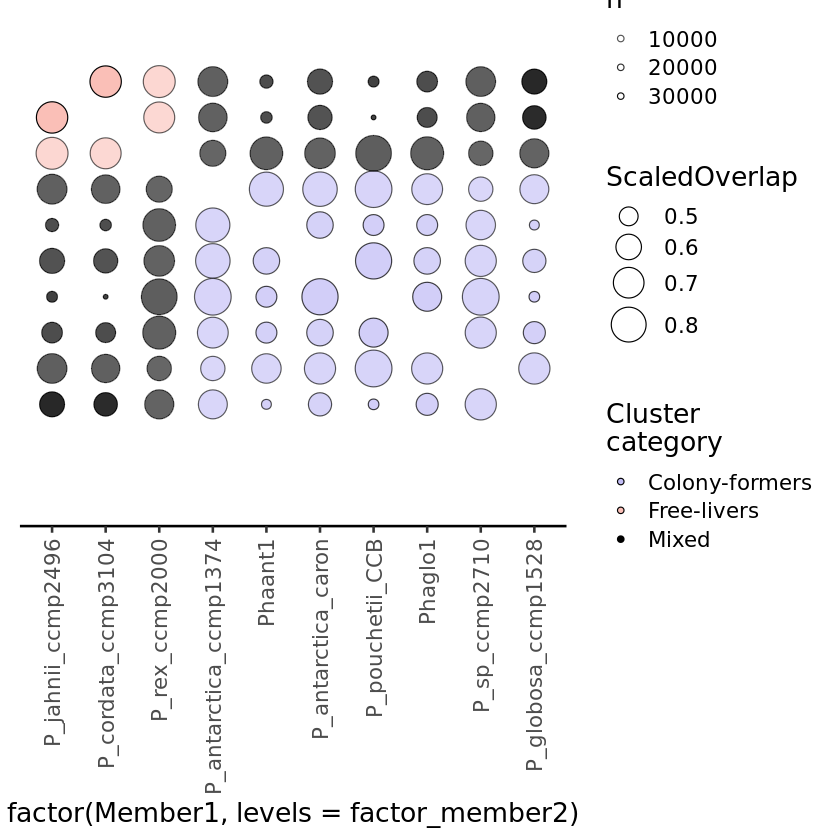

In [22]:
tree_data=scaled_tree$data %>% tidyr::separate(label,sep="-phaeo",into=c("label","extra1"))%>% 
    tidyr::separate(label,sep="-genome",into=c("label","extra2")) %>%
    dplyr::filter((label!="Chrsp") & (label!="Oxytri1") & (label!="Guith1"))

factor_member2=unique((tree_data %>% dplyr::arrange(desc(y)))$label)

heatmap_plt=ggplot(final_df %>% 
       dplyr::mutate(Member1_temp=case_when((Member2=="MMETSP0595")&
                                            (Member1!="Chrsp")&
                                            (Member1!="Guith1")~Member2,
                                            TRUE ~ Member1),
                     Member2_temp=case_when((Member2=="MMETSP0595")&
                                            (Member1!="Chrsp")&
                                            (Member1!="Guith1")~Member1,
                                            TRUE ~ Member2)) %>%
       dplyr::mutate(Member1=Member1_temp,Member2=Member2_temp) %>% 
       dplyr::left_join(tree_data,by=c("Member2"="label")) %>% 
       dplyr::filter(grepl("P_",Member2)|grepl("Pha",Member2)) %>% 
                   dplyr::mutate(Member2=factor(Member2,levels=factor_member2))%>% 
       dplyr::mutate(Member1=factor(Member1,levels=factor_member2)) %>% dplyr::filter(!is.na(Member1)) %>%
       dplyr::mutate(Grouping = case_when((Member1=="P_pouchetii_CCB")&(grepl("ant",Member2))~"Colony-formers",
                                          (Member1=="P_pouchetii_CCB")&(grepl("glo",Member2))~"Colony-formers",
                                          (Member2=="P_pouchetii_CCB")&(grepl("ant",Member1))~"Colony-formers",
                                          (Member2=="P_pouchetii_CCB")&(grepl("glo",Member1))~"Colony-formers",
                                          (Member2=="P_pouchetii_CCB")&(grepl("P_sp",Member1))~"Colony-formers",
                                          (Member1=="P_pouchetii_CCB")&(grepl("P_sp",Member2))~"Colony-formers",
                                          (Member1=="P_pouchetii_CCB")&(grepl("P_pouchetii_CCB",Member2))~"Colony-formers",
                                          (Member1=="P_pouchetii_CCB")|(Member2=="P_pouchetii_CCB")~"Mixed",
                                          TRUE ~ Grouping)) %>%
        dplyr::left_join(final_df %>% dplyr::filter(Member1==Member2) %>% dplyr::arrange(desc(n)) %>%
    dplyr::rename(c("SelfMatches1"="n","Member"="Member1")) %>%
    dplyr::select(SelfMatches1,Member),by=c("Member1"="Member"))%>%
        dplyr::left_join(final_df %>% dplyr::filter(Member1==Member2) %>% dplyr::arrange(desc(n)) %>%
    dplyr::rename(c("SelfMatches2"="n","Member"="Member2")) %>%
    dplyr::select(SelfMatches2,Member),by=c("Member2"="Member")) %>%
                  rowwise() %>%
                  dplyr::mutate(MeanMatches1and2=min(SelfMatches1,SelfMatches2))%>%
                  dplyr::mutate(ScaledOverlap=n/MeanMatches1and2) %>%
                  dplyr::filter(Member1!=Member2)) + 
    geom_point(aes(y = y, x = factor(Member1,levels=factor_member2), 
                   fill=Grouping, alpha=n, size=ScaledOverlap),pch=21) + 
    scale_alpha_continuous(range=c(0.6,1))+
    theme_bw(base_size=16) + 
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))+ 
    scale_fill_manual(breaks=c("Colony-formers","Free-livers","Outsiders","Mixed"),
                      values=c("#c2bdf5","#fabfb7","gray","black"),
                      name="Cluster\ncategory") +
    scale_size(range=c(1,10)) +ylim(c(2,15))+
      theme(axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.title.y=element_blank(),
            axis.line.y = element_line(colour = "transparent"),
            axis.line.x = element_line(colour = "black"),
            panel.grid.major = element_blank(),
            panel.grid.minor = element_blank(),
            panel.border = element_blank(),
            panel.background = element_blank())
heatmap_plt

In [11]:
head(orthogroups_file)

Orthogroup
1 OG0000000 
2 OG0000001 
3 OG0000002 
4 OG0000003 
5 OG0000004 
6 OG0000005 
  X3492.aik.aa                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [49]:
tax_tab = read.csv("../jupyter-notebooks/mmetsp-tax.txt") %>%
        dplyr::bind_rows(data.frame("Labels"=c("Phaant1","Phaglo1","Oxytri1",
                                               "Chrsp","Guith1","rmdup_PhaeoCCB","P_pouchetii_CCB"),
                                    "Domain"=c("Eukaryota","Eukaryota","Eukaryota",
                                              "Eukaryota","Eukaryota","Eukaryota","Eukaryota"),
                                    "Phylum"=c("Haptophyta","Haptophyta","Ciliophora",
                                              "Haptophyta","Cryptophyta","Haptophyta","Haptophyta"),
                                    "Class"=c("Prymnesiophyceae","Prymnesiophyceae","Spirotrichea",
                                              "Eukaryota","Cryptophyceae","Prymnesiophyceae",
                                              "Prymnesiophyceae"),
                                    "Order"=c("Phaeocystales","Phaeocystales","Sporadotrichida",
                                              "Prymnesiales","Pyrenomonadales","Phaeocystales",
                                              "Phaeocystales"),
                                    "Family"=c("Phaeocystaceae","Phaeocystaceae","Oxytrichidae",
                                              "Chrysochromulinaceae","Geminigeraceae","Phaeocystaceae",
                                              "Phaeocystaceae"),
                                    "Genus"=c("Phaeocystis","Phaeocystis","Oxytricha",
                                              "Chrysochromulina","Guillardia","Phaeocystis","Phaeocystis"),
                                    "Species"=c("Phaeocystis antarctica",
                                                "Phaeocystis globosa",
                                                "Oxytricha trifallax",
                                              "Chrysochromulina tobinii","Guillardia theta",
                                                "Phaeocystis pouchetii",
                                                "Phaeocystis pouchetii"))) %>%
        dplyr::bind_rows(read.csv("../jupyter-notebooks/phaeo-taxonomy-table.txt",sep="\t"))%>%
    dplyr::mutate(Species = case_when(Species=="huxleyi" ~ "Emiliania huxleyi",
                                      Species=="galbana" ~ "Isochrysis galbana",
                                      Species=="oceanica" ~ "Gephyrocapsa oceanica",
                                      Species=="Phaeocystis sp." ~ "Phaeocystis globosa",
                                      TRUE ~ Species)) %>%
    dplyr::mutate(Source_ID=case_when(is.na(Source_ID)~Labels,
                                     TRUE ~ Source_ID))

real_names = data.frame("FileName" = c('Chrsp.genome.aa','Guith1.genome.aa','MMETSP0595.mmetsp.aa',
                                       'MMETSP0943.mmetsp.aa','MMETSP0994.mmetsp.aa','MMETSP0995.mmetsp.aa',
                                       'MMETSP0996.mmetsp.aa','MMETSP0997.mmetsp.aa','MMETSP1006.mmetsp.aa',
                                       'MMETSP1007.mmetsp.aa','MMETSP1008.mmetsp.aa','MMETSP1009.mmetsp.aa',
                                       'MMETSP1150.mmetsp.aa','MMETSP1151.mmetsp.aa','MMETSP1152.mmetsp.aa',
                                       'MMETSP1153.mmetsp.aa','MMETSP1154.mmetsp.aa','MMETSP1156.mmetsp.aa',
                                       'MMETSP1157.mmetsp.aa','MMETSP1363.mmetsp.aa','MMETSP1364.mmetsp.aa',
                                       'MMETSP1365.mmetsp.aa','MMETSP1366.mmetsp.aa','Oxytri1.genome.aa',
                                       'P_ant_jgi.phaeo.aa','P_antarctica_caron.phaeo.aa',
                                       'P_antarctica_ccmp1374.phaeo.aa','P_cordata_ccmp3104.phaeo.aa',
                                       'P_globosa_ccmp1528.phaeo.aa','P_globosa_jgi.phaeo.aa',
                                       'P_jahnii_ccmp2496.phaeo.aa','P_pouchetii_CCB.phaeo.aa',
                                       'P_rex_ccmp2000.phaeo.aa','P_sp_ccmp2710.phaeo.aa',
                                       'Phaant1.genome.aa','Phaglo1.genome.aa','rmdup_PhaeoCCB.phaeo.aa',
                                       'rmdup_PhaeoCCB.aa')) %>%
    dplyr::mutate(File_Name=FileName) %>%
    tidyr::separate(FileName,sep="\\.",into=c("ShortCode","extras")) %>%
    dplyr::left_join(tax_tab,by=c("ShortCode"="Source_ID")) %>%
    dplyr::mutate(Grouping=case_when(Species%in%c("Phaeocystis antarctica",
                                                  "Phaeocystis globosa",
                                                  "Phaeocystis pouchetii")~"Colony-former",
                                     Species %in% c("Phaeocystis jahnii",
                                                    "Phaeocystis rex",
                                                    "Phaeocystis cordata") ~ "Free-living",
                                     TRUE ~ "Outgroup"))

head(orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")))

Warning message:
“Expected 2 pieces. Additional pieces discarded in 37 rows [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, ...].”


Orthogroup Reference           
1 OG0000000  Chrsp.genome.aa     
2 OG0000000  Guith1.genome.aa    
3 OG0000000  MMETSP0595.mmetsp.aa
4 OG0000000  MMETSP0943.mmetsp.aa
5 OG0000000  MMETSP0994.mmetsp.aa
6 OG0000000  MMETSP0995.mmetsp.aa
  Gene                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [50]:
total_ogs = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")) %>%
    dplyr::filter(Gene!="") %>%
    dplyr::group_by(Species,ShortCode) %>% dplyr::tally()

In [54]:
pasteuniq<-function(grp_in) {
    return(paste(sort(unique(grp_in)),collapse="|"))
}
pasteuniq<-function(grp_in) {
    return(paste(sort(unique(grp_in)),collapse="|"))
}
total_ogs_crisscross = orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")) %>%
    dplyr::filter(Gene!="") %>%
    dplyr::group_by(Orthogroup) %>% dplyr::summarize(n=length(unique(ShortCode)),
                                                     grouping=pasteuniq(Grouping)) %>%
    dplyr::left_join(orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")) %>%
    dplyr::filter(Gene!="") %>% dplyr::select(Species,Orthogroup,ShortCode,Grouping))

Joining, by =
"Orthogroup"


In [78]:
scaled_tree$data %>% tidyr::separate(label,sep="-",into=c("ShortCode","extra"))

parent,node,branch.length,ShortCode,extra,isTip,x,y,branch,angle,scale
<int>,<int>,<dbl>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
34,1,2.188303e-01,P_jahnii_ccmp2496,phaeo,TRUE,1.0006870,13.745508,0.8912719,334.35019,1.0
35,2,1.247258e-01,P_cordata_ccmp3104,phaeo,TRUE,0.8457859,12.745508,0.7834229,310.02587,1.0
36,3,8.463422e-02,P_rex_ccmp2000,phaeo,TRUE,0.7451009,11.745508,0.7027838,285.70154,1.0
38,4,3.240288e-02,P_pouchetii_CCB,phaeo,TRUE,0.6645108,7.745508,0.6483094,188.40424,1.0
39,5,9.857759e-03,P_antarctica_caron,phaeo,TRUE,0.6612954,8.745508,0.6563665,212.72857,1.0
40,6,1.390551e-04,Phaant1,genome,TRUE,0.6523641,9.745508,0.6522946,237.05289,1.0
40,7,5.112573e-03,P_antarctica_ccmp1374,phaeo,TRUE,0.6573377,10.745508,0.6547814,261.37722,1.0
41,8,1.730713e-02,Phaglo1,genome,TRUE,0.6006452,6.745508,0.5919916,164.07992,1.0
42,9,2.106508e-03,P_sp_ccmp2710,phaeo,TRUE,0.5730039,5.745508,0.5719507,139.75560,1.0


`summarise()` has grouped
output by 'ShortCode'.
You can override using
the `.groups` argument.
Joining, by = "ShortCode"
Warning message:
“Removed 10 rows
containing missing values
(`position_stack()`).”


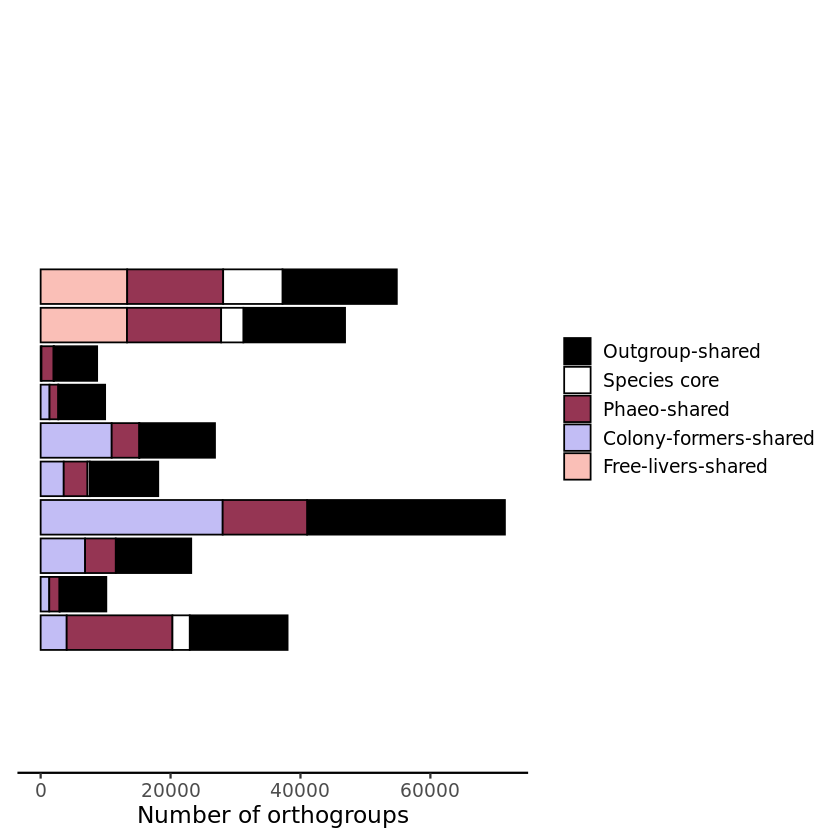

In [89]:
og_crisscross_plot = ggplot(total_ogs_crisscross %>% dplyr::mutate(spec_or_shared = case_when(n==1 ~ "specific",
                                                                  n > 1 ~ "shared")) %>%
    dplyr::group_by(ShortCode,Species,grouping,spec_or_shared,Grouping) %>% dplyr::tally() %>%
    dplyr::filter(grepl("Phaeo",Species)) %>% 
    dplyr::mutate(FinalLabel=case_when(spec_or_shared=="specific" ~ "Species core",
                                       (grouping==Grouping)&grepl("Colony",grouping) ~ "Colony-formers-shared",
                                       (grouping==Grouping)&!grepl("Colony",grouping) ~ "Free-livers-shared",
                                       grepl("Outgroup",grouping)~"Outgroup-shared",
                                       TRUE ~ "Phaeo-shared")) %>%
    dplyr::group_by(ShortCode,FinalLabel) %>% dplyr::summarize(n=sum(n)) %>%
    dplyr::left_join(scaled_tree$data %>% tidyr::separate(label,sep="-",into=c("ShortCode","extra"))))+
    geom_bar(aes(x = y, y = n, fill = factor(FinalLabel,
                                                     levels=c("Outgroup-shared",
                                                              "Species core",
                                                              "Within-group shared",
                                                              "Phaeo-shared",
                                                              "Colony-formers-shared",
                                                              "Free-livers-shared"))),stat="identity",
            color="black") + xlim(c(2,20)) + 
    coord_flip() + scale_fill_manual(name="",
                                       breaks=c("Outgroup-shared",
                                                  "Species core",
                                                  "Within-group shared",
                                                  "Phaeo-shared",
                                                  "Colony-formers-shared",
                                                  "Free-livers-shared"),
                                       values=c("black","white","#953553",
                                                "#953553","#c2bdf5","#fabfb7")) + 
    ylab("Number of orthogroups") + theme_bw(base_size=14)+ 
    theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "black"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())

og_crisscross_plot

Scale for y is already
present.
Adding another scale for
y, which will replace the
existing scale.
Warning message:
“Removed 10 rows
containing missing values
(`position_stack()`).”
Warning message:
“Removed 10 rows
containing missing values
(`position_stack()`).”
Warning message:
“Removed 10 rows
containing missing values
(`position_stack()`).”


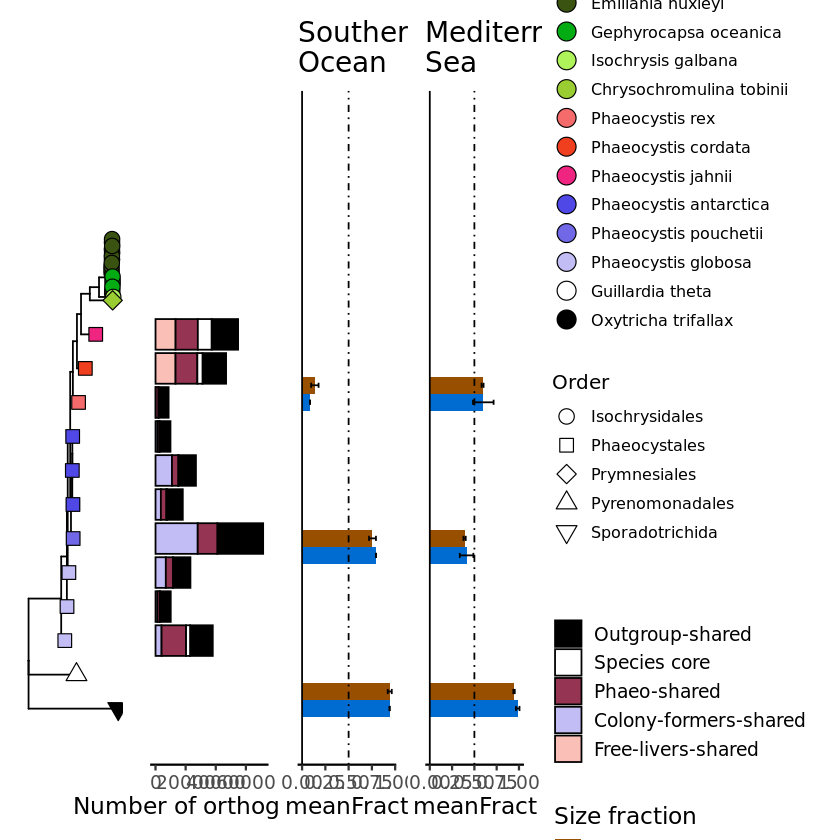

In [100]:
(((scaled_tree+theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank(),
        axis.title.x=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "transparent"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())+ylim(c(2,20)))|og_crisscross_plot|total_db_plot+ggtitle("Southern\nOcean")|
             total_db_plot_ms+ggtitle("Mediterranean\nSea")))+ 
        plot_layout(guides="collect",widths=c(1,1.2,1,1))
ggsave("new_tree.png",width=14,height=10,units="in",dpi=300)
ggsave("new_tree.pdf",width=14,height=12,units="in",dpi=300)

Scale for y is already
present.
Adding another scale for
y, which will replace the
existing scale.
Warning message:
“Removed 10 rows
containing missing values
(`position_stack()`).”
Warning message:
“Removed 10 rows
containing missing values
(`position_stack()`).”


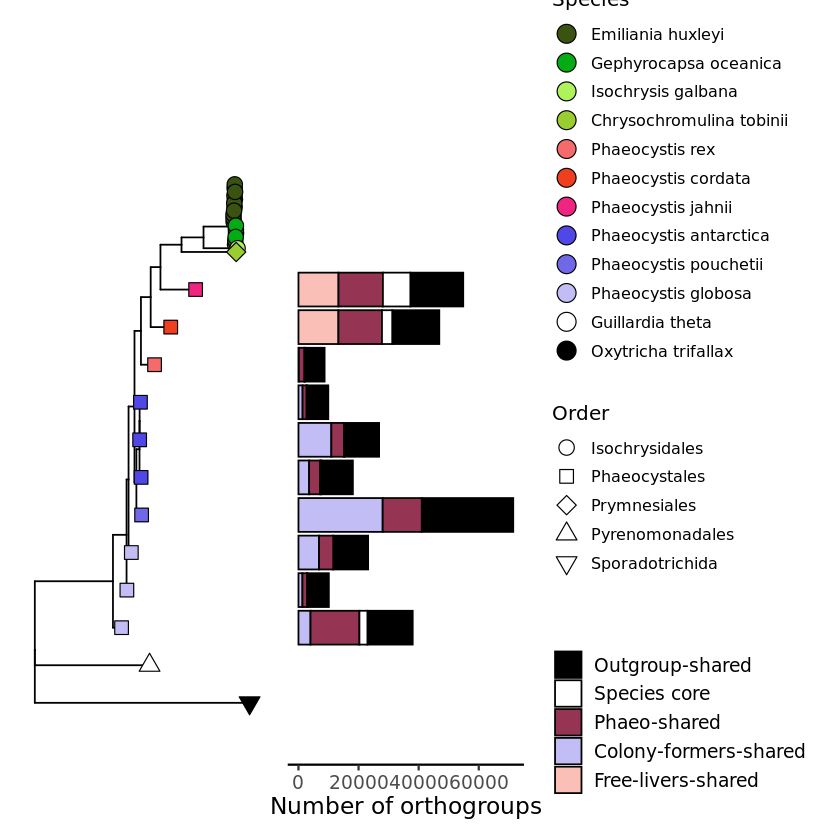

In [99]:
((scaled_tree+theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank(),
        axis.title.x=element_blank(),
        axis.line.y = element_line(colour = "transparent"),
        axis.line.x = element_line(colour = "transparent"),
        panel.grid.major = element_blank(),
        panel.grid.minor = element_blank(),
        panel.border = element_blank(),
        panel.background = element_blank())+ylim(c(2,20)))|og_crisscross_plot)+ 
        plot_layout(guides="collect")
ggsave("tree_w_ogs.pdf",width=14,height=12,units="in",dpi=300)

In [42]:
total_ogs_crisscross %>% dplyr::mutate(spec_or_shared = case_when(n==1 ~ "specific",
                                                                  n > 1 ~ "shared")) %>%
    dplyr::group_by(ShortCode,Species,grouping,spec_or_shared) %>% dplyr::tally() %>%
    dplyr::filter(grepl("Phaeo",Species))

ShortCode,Species,grouping,spec_or_shared,n
<chr>,<chr>,<chr>,<chr>,<int>
P_ant_jgi,Phaeocystis antarctica,Colony-former,shared,9503
P_ant_jgi,Phaeocystis antarctica,Colony-former,specific,11
P_ant_jgi,Phaeocystis antarctica,Colony-former|Free-living,shared,5681
P_ant_jgi,Phaeocystis antarctica,Colony-former|Free-living|Outgroup,shared,11331
P_ant_jgi,Phaeocystis antarctica,Colony-former|Outgroup,shared,313
P_antarctica_caron,Phaeocystis antarctica,Colony-former,shared,873
P_antarctica_caron,Phaeocystis antarctica,Colony-former,specific,350
P_antarctica_caron,Phaeocystis antarctica,Colony-former|Free-living,shared,6342
P_antarctica_caron,Phaeocystis antarctica,Colony-former|Free-living|Outgroup,shared,10304


In [37]:
total_ogs_crisscross %>% dplyr::filter((grouping=="Colony-former") & (n >= 2))

Orthogroup,n,grouping
<chr>,<int>,<chr>
OG0001042,2,Colony-former
OG0002811,4,Colony-former
OG0003099,3,Colony-former
OG0003100,2,Colony-former
OG0003101,5,Colony-former
OG0005677,2,Colony-former
OG0008332,4,Colony-former
OG0009627,4,Colony-former
OG0009967,7,Colony-former


In [36]:
total_ogs_crisscross %>% dplyr::filter((grouping=="Free-living") & (n >= 2))

Orthogroup,n,grouping
<chr>,<int>,<chr>
OG0000156,2,Free-living
OG0000385,2,Free-living
OG0000399,2,Free-living
OG0000817,2,Free-living
OG0001732,2,Free-living
OG0002638,2,Free-living
OG0003571,2,Free-living
OG0005054,2,Free-living
OG0005459,2,Free-living


In [38]:
total_ogs_crisscross %>% dplyr::filter((grouping=="Colony-former|Free-living") & (n >= 2))

Orthogroup,n,grouping
<chr>,<int>,<chr>
OG0000128,4,Colony-former|Free-living
OG0000193,3,Colony-former|Free-living
OG0000229,2,Colony-former|Free-living
OG0000348,3,Colony-former|Free-living
OG0000389,11,Colony-former|Free-living
OG0000556,12,Colony-former|Free-living
OG0000727,3,Colony-former|Free-living
OG0000784,12,Colony-former|Free-living
OG0000799,3,Colony-former|Free-living


In [19]:
paste_together_sort <- function(input_list) {
    return(paste(sort(unique(input_list)),collapse="_"))
}

combined_og_contents=orthogroups_file %>% 
    dplyr::select(-X3492.aik.aa,-X914.aik.aa) %>%
    tidyr::pivot_longer(cols=!starts_with("Orthogroup"),names_to="Reference",
                        values_to="Gene") %>%
    dplyr::left_join(real_names,by=c("Reference"="File_Name")) %>%
    dplyr::filter(Gene!="") %>% dplyr::group_by(Orthogroup) %>%
    dplyr::summarize(ShortCode=paste_together_sort(ShortCode))

## count out the OGs that are specific to the free-livers.

In [27]:
combined_og_contents %>% dplyr::filter((ShortCode=="P_cordata_ccmp3104_P_jahnii_ccmp2496_P_rex_ccmp2000")|
                                       (ShortCode=="P_cordata_ccmp3104_P_jahnii_ccmp2496"))

Orthogroup,ShortCode
<chr>,<chr>
OG0000156,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000385,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000399,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000817,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0001732,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0002638,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0003571,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0005054,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0005459,P_cordata_ccmp3104_P_jahnii_ccmp2496


In [24]:
combined_og_contents %>% dplyr::filter(ShortCode=="P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB")

Orthogroup,ShortCode
<chr>,<chr>
OG0001933,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0002306,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0003743,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0004661,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0007188,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0007197,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0007725,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0007728,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0010739,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_cordata_ccmp3104_P_globosa_ccmp1528_P_globosa_jgi_P_jahnii_ccmp2496_P_pouchetii_CCB_P_rex_ccmp2000_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB


In [25]:
combined_og_contents %>% dplyr::filter(ShortCode=="P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB")

Orthogroup,ShortCode
<chr>,<chr>
OG0002913,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0004022,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0006899,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0007727,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0009608,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0011122,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0013789,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0013792,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB
OG0014840,P_ant_jgi_P_antarctica_caron_P_antarctica_ccmp1374_P_globosa_ccmp1528_P_globosa_jgi_P_pouchetii_CCB_P_sp_ccmp2710_Phaant1_Phaglo1_rmdup_PhaeoCCB


In [26]:
combined_og_contents %>% dplyr::filter((grepl("P_cordata_ccmp3104",ShortCode)|
                                       grepl("P_jahnii_ccmp2496",ShortCode)|
                                       grepl("P_rex_ccmp2000",ShortCode))&
                                       !grepl("P_ant_jgi",ShortCode) &
                                       !grepl("P_antarctica_caron",ShortCode)&
                                       !grepl("P_antarctica_ccmp1374",ShortCode)&
                                       !grepl("P_globosa_ccmp1528",ShortCode)&
                                       !grepl("P_globosa_jgi",ShortCode)&
                                       !grepl("P_pouchetii_CCB",ShortCode)&
                                       !grepl("P_sp_ccmp2710",ShortCode)&
                                       !grepl("Phaant1",ShortCode)&
                                       !grepl("Phaglo1",ShortCode)&
                                       !grepl("rmdup_PhaeoCCB",ShortCode))

Orthogroup,ShortCode
<chr>,<chr>
OG0000156,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000257,MMETSP0994_MMETSP0995_MMETSP0996_MMETSP0997_MMETSP1006_MMETSP1007_MMETSP1008_MMETSP1009_MMETSP1150_MMETSP1151_MMETSP1152_MMETSP1153_MMETSP1154_MMETSP1156_MMETSP1157_MMETSP1363_MMETSP1364_MMETSP1365_MMETSP1366_P_cordata_ccmp3104
OG0000385,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000399,P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000425,MMETSP0994_MMETSP0995_MMETSP0996_MMETSP0997_MMETSP1006_MMETSP1007_MMETSP1008_MMETSP1009_MMETSP1150_MMETSP1151_MMETSP1152_MMETSP1153_MMETSP1154_MMETSP1156_MMETSP1157_MMETSP1363_MMETSP1364_MMETSP1365_MMETSP1366_P_jahnii_ccmp2496
OG0000537,MMETSP0994_MMETSP0995_MMETSP0996_MMETSP0997_MMETSP1006_MMETSP1007_MMETSP1008_MMETSP1009_MMETSP1150_MMETSP1151_MMETSP1152_MMETSP1153_MMETSP1154_MMETSP1156_MMETSP1157_MMETSP1363_MMETSP1364_MMETSP1365_MMETSP1366_P_cordata_ccmp3104_P_jahnii_ccmp2496
OG0000611,Guith1_MMETSP0994_MMETSP0995_MMETSP0996_MMETSP0997_MMETSP1006_MMETSP1007_MMETSP1008_MMETSP1009_MMETSP1150_MMETSP1151_MMETSP1152_MMETSP1153_MMETSP1154_MMETSP1156_MMETSP1157_MMETSP1363_MMETSP1364_MMETSP1365_MMETSP1366_P_jahnii_ccmp2496
OG0000632,MMETSP0995_MMETSP0996_MMETSP1008_MMETSP1150_MMETSP1151_MMETSP1152_MMETSP1153_MMETSP1154_MMETSP1156_MMETSP1157_MMETSP1363_MMETSP1364_MMETSP1365_MMETSP1366_P_jahnii_ccmp2496
OG0000738,Chrsp_MMETSP0994_MMETSP0995_MMETSP0996_MMETSP0997_MMETSP1006_MMETSP1007_MMETSP1008_MMETSP1009_MMETSP1150_MMETSP1152_MMETSP1153_MMETSP1154_MMETSP1156_MMETSP1157_MMETSP1363_MMETSP1364_MMETSP1365_MMETSP1366_P_cordata_ccmp3104_P_jahnii_ccmp2496
